# Image Segmentation
In this notebook, state-of-the-art models for image segmentation are used on some example images. Both FCN Resnet101 and Mask R-CNN will be used to perform semantic segmentation. This means that objects from the same class have the same mask color. 

In [1]:
# Imports
import cv2
import torch
import numpy as np
import torchvision
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torchvision.transforms.functional import pil_to_tensor, to_pil_image
from torchvision.utils import draw_segmentation_masks

## Loading the Images

In [2]:
# Load images
image1 = cv2.imread('../../data/horses.jpg')
image2 = cv2.imread('../../data/people.jpg')
image3 = cv2.imread('../../data/street.jpg')

# Convert to tensor
convert_tensor = transforms.ToTensor()
image1 = convert_tensor(image1)
image2 = convert_tensor(image2)
image3 = convert_tensor(image3)

## FCN Resnet101

### Loading the Model
The pre-trained FCN Resnet101 will be loaded here. This model is pre-trained on the COCO dataset.

In [3]:
# Load pretrained Resnet 101 model
model = torchvision.models.segmentation.fcn_resnet101(weights=torchvision.models.segmentation.FCN_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1)

# Set in evaluation mode
model.eval()

FCN(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequenti

### Image Pre-processing


The images need to be processed in such a way that these can be presented to the model in the correct form. This done here:

In [4]:
img_preprocess = torchvision.models.segmentation.FCN_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1.transforms(resize_size=None)

In [5]:
Horses_preprocess = img_preprocess(Horses).unsqueeze(dim=0) # unsqueeze at index 0 because the batch_size is 1
People_preprocess = img_preprocess(People).unsqueeze(dim=0)
Street_preprocess = img_preprocess(Street).unsqueeze(dim=0)

NameError: name 'Horses' is not defined

### Predicting the Segmentation Masks
The FCN Resnet101 model is now used on the example images to predict the segmentation masks.


In [ ]:
Horses_pred = model(Horses_preprocess)
People_pred = model(People_preprocess)
Street_pred = model(Street_preprocess)

The 2 keys of the predicition are out and aux, where out contains the object masks:

In [ ]:
Horses_pred.keys()

odict_keys(['out', 'aux'])

### Results
The predictions of the model are now visualised for each example image.

First, a mapping from the class labels to their respective indices need to be created:

In [ ]:
class_to_ind = {cls: i for (i,cls) in enumerate(torchvision.models.segmentation.FCN_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1.meta["categories"])}
class_to_ind

{'__background__': 0,
 'aeroplane': 1,
 'bicycle': 2,
 'bird': 3,
 'boat': 4,
 'bottle': 5,
 'bus': 6,
 'car': 7,
 'cat': 8,
 'chair': 9,
 'cow': 10,
 'diningtable': 11,
 'dog': 12,
 'horse': 13,
 'motorbike': 14,
 'person': 15,
 'pottedplant': 16,
 'sheep': 17,
 'sofa': 18,
 'train': 19,
 'tvmonitor': 20}

The prediction is situated in the out key. The shape of out is (the number of classes, height, width). The number of classes is here 20. The softmax function is then used to normalise the masks. When we provide a certain class, the segmentation masks of these object will be returned by using to_pil_image.

Torchvision contains a module named draw_segmentation_masks() that makes it possible to overlay the detected objects masks on the image.

Image example 1:

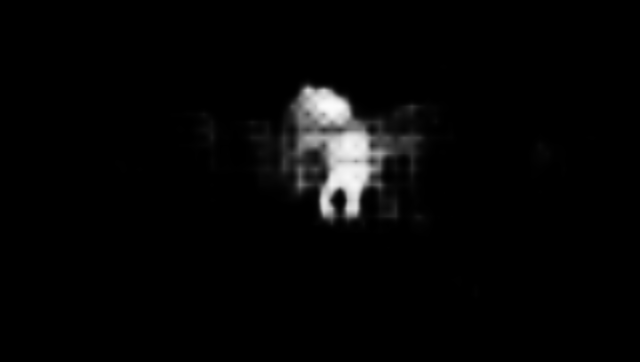

In [ ]:
masks = Horses_pred['out']
normalised_masks = masks.softmax(dim=1)[0]

to_pil_image(normalised_masks[class_to_ind['horse']])

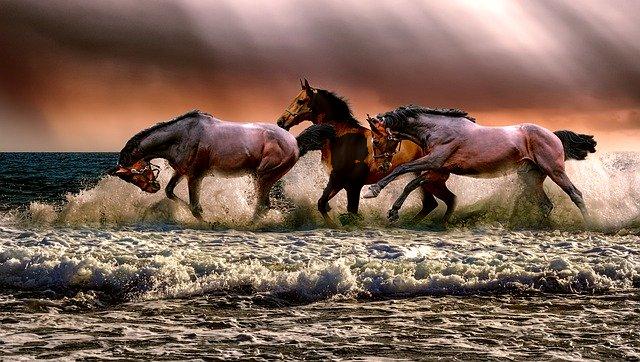

In [ ]:
masks = normalised_masks > 0.7 # only the mask pixels with a high probability are used
segmented_image = draw_segmentation_masks(Horses, masks[class_to_ind['horse']])

to_pil_image(segmented_image)

As can be seen, the horses are not very well segmented. This can be due to the overlapping of the horses.

Image example 2:

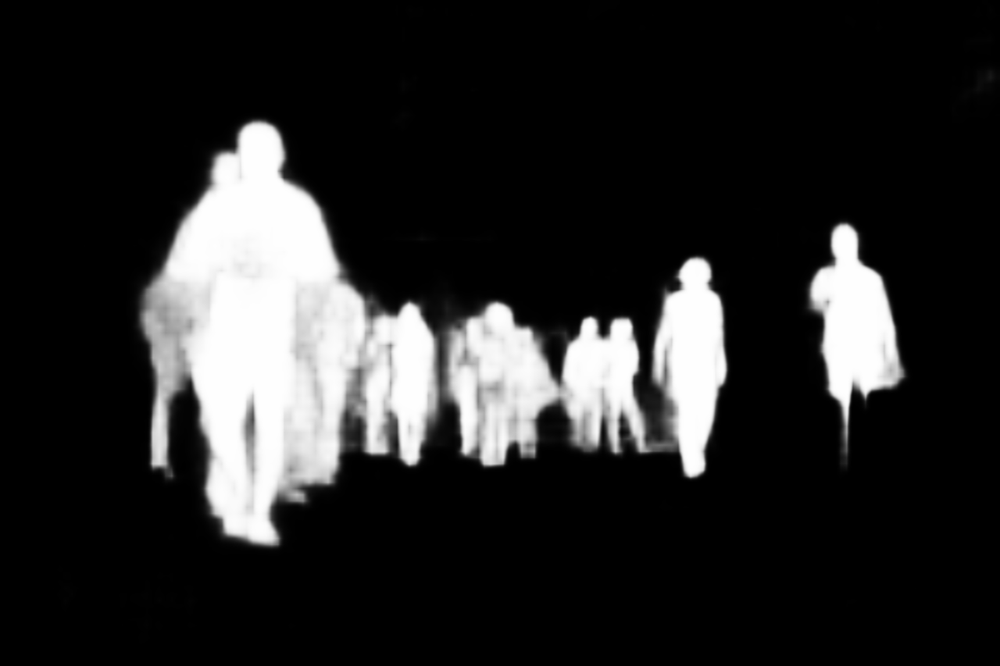

In [ ]:
masks = People_pred['out']
normalised_masks = masks.softmax(dim=1)[0]

to_pil_image(normalised_masks[class_to_ind['person']])

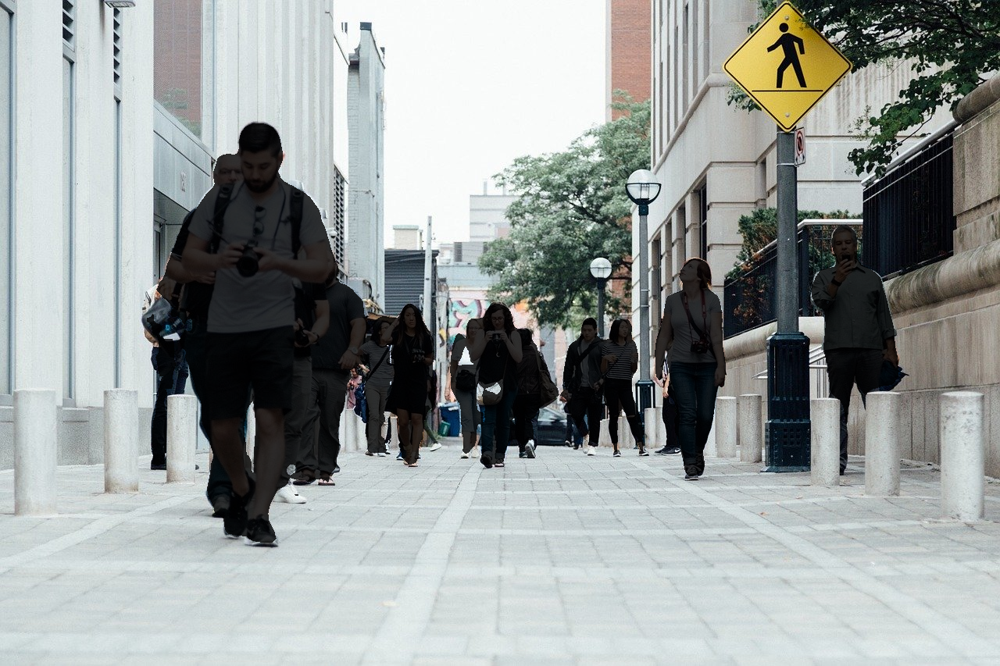

In [ ]:
masks = normalised_masks > 0.7 # only the mask pixels with a high probability are used
segmented_image = draw_segmentation_masks(People, masks[class_to_ind['person']])

to_pil_image(segmented_image)

The people in this example image are segmented very well. This has a better result than the previous image.

Image example 3:

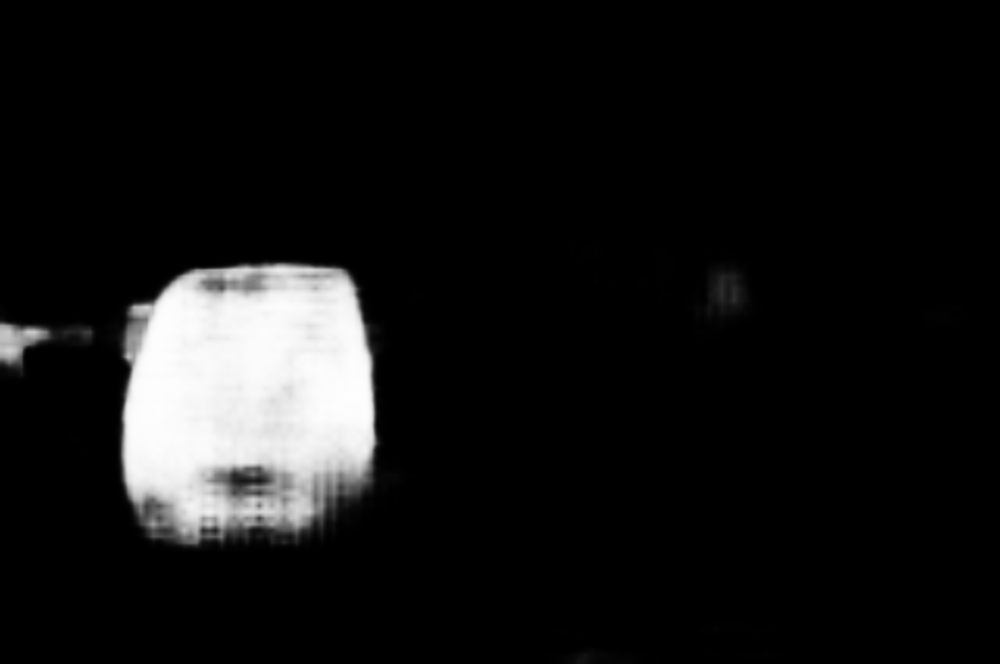

In [ ]:
masks = Street_pred['out']
normalised_masks = masks.softmax(dim=1)[0]

to_pil_image(normalised_masks[class_to_ind['car']])

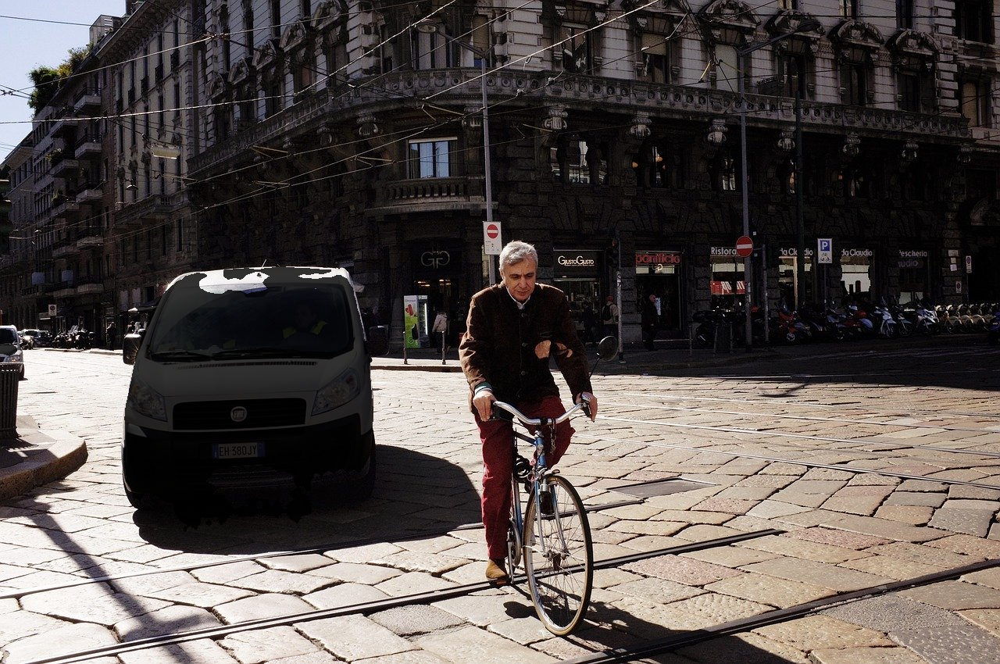

In [ ]:
masks = normalised_masks > 0.7 # only the mask pixels with a high probability are used
segmented_image = draw_segmentation_masks(Street, masks[class_to_ind['car']])

to_pil_image(segmented_image)

The nearest car is very well segmented. The model has more difficulty to segment the car that is further situated in the image.

## Mask R-CNN

### Loading the Model
The pre-trained Mask R-CNN will be loaded here. This model is pre-trained on the COCO dataset.

In [ ]:
model = torchvision.models.detection.maskrcnn_resnet50_fpn_v2(weights=torchvision.models.detection.MaskRCNN_ResNet50_FPN_V2_Weights.COCO_V1)
model.eval() # put the model in evaluation mode (no target required)

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         

### Image Pre-processing


The images need to be processed in such a way that these can be presented to the model in the correct form. This done here:

In [ ]:
img_preprocess = torchvision.models.detection.MaskRCNN_ResNet50_FPN_V2_Weights.COCO_V1.transforms()

In [ ]:
Horses_preprocess = img_preprocess(Horses).unsqueeze(dim=0) # unsqueeze at index 0 because the batch_size is 1
People_preprocess = img_preprocess(People).unsqueeze(dim=0)
Street_preprocess = img_preprocess(Street).unsqueeze(dim=0)

### Predicting the Segmentation Masks
The Mask R-CNN model is now used on the example images to predict the segmentation masks.


In [ ]:
Horses_pred = model(Horses_preprocess)
People_pred = model(People_preprocess)
Street_pred = model(Street_preprocess)

The 4 keys of the predicition are boxes, labels, scores and masks.

In [ ]:
Horses_pred[0].keys()

dict_keys(['boxes', 'labels', 'scores', 'masks'])

### Results
The predictions of the model are now visualised for each example image.

First, a mapping from the class labels to their respective indices need to be created:

In [ ]:
class_to_ind = {cls: i for (i,cls) in enumerate(torchvision.models.detection.MaskRCNN_ResNet50_FPN_V2_Weights.COCO_V1.meta["categories"])}
class_to_ind

{'__background__': 0,
 'person': 1,
 'bicycle': 2,
 'car': 3,
 'motorcycle': 4,
 'airplane': 5,
 'bus': 6,
 'train': 7,
 'truck': 8,
 'boat': 9,
 'traffic light': 10,
 'fire hydrant': 11,
 'N/A': 83,
 'stop sign': 13,
 'parking meter': 14,
 'bench': 15,
 'bird': 16,
 'cat': 17,
 'dog': 18,
 'horse': 19,
 'sheep': 20,
 'cow': 21,
 'elephant': 22,
 'bear': 23,
 'zebra': 24,
 'giraffe': 25,
 'backpack': 27,
 'umbrella': 28,
 'handbag': 31,
 'tie': 32,
 'suitcase': 33,
 'frisbee': 34,
 'skis': 35,
 'snowboard': 36,
 'sports ball': 37,
 'kite': 38,
 'baseball bat': 39,
 'baseball glove': 40,
 'skateboard': 41,
 'surfboard': 42,
 'tennis racket': 43,
 'bottle': 44,
 'wine glass': 46,
 'cup': 47,
 'fork': 48,
 'knife': 49,
 'spoon': 50,
 'bowl': 51,
 'banana': 52,
 'apple': 53,
 'sandwich': 54,
 'orange': 55,
 'broccoli': 56,
 'carrot': 57,
 'hot dog': 58,
 'pizza': 59,
 'donut': 60,
 'cake': 61,
 'chair': 62,
 'couch': 63,
 'potted plant': 64,
 'bed': 65,
 'dining table': 67,
 'toilet': 70,


Torchvision contains a module named draw_segmentation_masks() that makes it possible to overlay the detected objects masks on the image. Colors are also provided for the different categories of objects. 

Image example 1:

In [ ]:
mapping = torchvision.models.detection.MaskRCNN_ResNet50_FPN_V2_Weights.COCO_V1.meta["categories"]

masks = Horses_pred[0]['masks'].squeeze()
labels = Horses_pred[0]['labels']
categories = [mapping[label] for label in labels[:10]] # only the 10 best predictions are considered

print("Detected object classes: {}".format(list(set(categories))))

Detected object classes: ['horse', 'bird', 'dog', 'elephant']


The only detected object class that we should expect here is the horse class. Also other classes such as bird dog and elephant are detected.

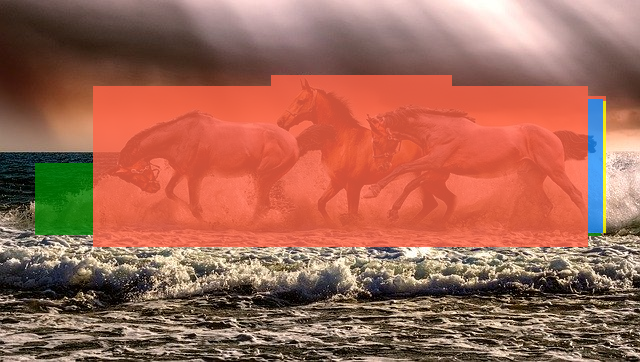

In [ ]:
color_mapping = {"horse":"tomato","bird":"dodgerblue","dog":"yellow","elephant":"green"}
colors = [color_mapping[mapping[label]] for label in labels]
output = draw_segmentation_masks(Horses, masks=masks.to(torch.bool), colors=colors)

to_pil_image(output)

The segmentation masks here are not very specific but rather block-shaped. Therefore a lot of background pixels are also labelled and considered as part of a specicific class. This is because the the R-CNN is originally a object detection model which outputs bounding boxes.

The horses are well segmented and the other 3 classes are wrong predicted. 

Image example 2: 

In [ ]:
masks = People_pred[0]['masks'].squeeze()
labels = People_pred[0]['labels']
categories = [mapping[label] for label in labels[:10]] # only the best 10 predictions are considered

print("Detected object classes: {}".format(list(set(categories))))

Detected object classes: ['person']


The only detected object class here is person. 

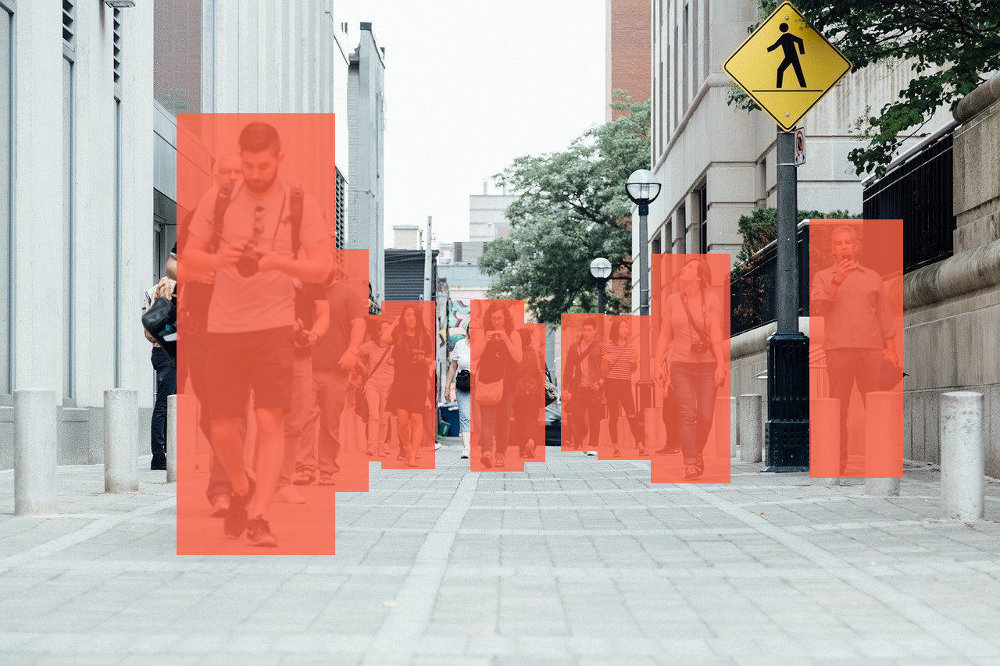

In [ ]:
color_mapping = {"person":"tomato"}
colors = [color_mapping[mapping[label]] for label in labels[:10]]
output = draw_segmentation_masks(People, masks=masks[:10].to(torch.bool), colors=colors)

to_pil_image(output)

Almost every person is segmented in the picture.

Image example 3:

In [ ]:
masks = Street_pred[0]['masks'].squeeze()
labels = Street_pred[0]['labels']
categories = [mapping[label] for label in labels[:10]] # only the best 10 predictions are considered

print("Detected object classes: {}".format(list(set(categories))))

Detected object classes: ['car', 'bicycle', 'motorcycle', 'person']


The classes of the Street image are of objects that we can expect to see in the streets.

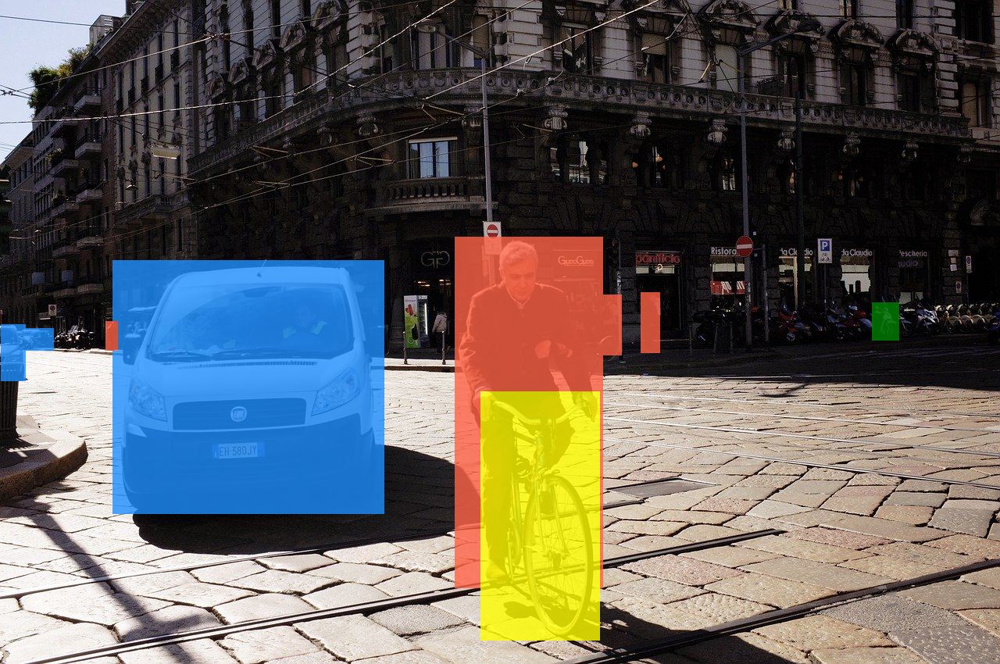

In [ ]:
color_mapping = {"person":"tomato","car":"dodgerblue","motorcycle":"green","bicycle":"yellow"}
colors = [color_mapping[mapping[label]] for label in labels[:10]]
output = draw_segmentation_masks(Street, masks=masks[:10].to(torch.bool), colors=colors)

to_pil_image(output)

The objects that are on the foreground of the image are very well segmented. The model has difficulties with segmenting objects that appear very small in the image and where the objects are overlapping. 